# Sound Event Classification

## Libraries

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import librosa
import sklearn
import tensorflow as tf
import IPython
from tensorflow.keras.callbacks import CSVLogger, EarlyStopping, ModelCheckpoint, LearningRateScheduler
import pandas as pd
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
plt.style.use("seaborn-v0_8")

## Dataset

### Loading of the dataset of the metadata and dataset analysis

In [2]:
fn_csv = 'ESC-50-master/meta/esc50.csv'

ds_files = []  # File list
ds_labels = []  # Class list

ds = pd.read_csv(fn_csv)
ds.head()

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A


In [3]:
#unique class labels
unique_classes = ds['category'].unique()
print("Unique classes:", unique_classes)

# Check the number of unique class labels
print("Count:", len(unique_classes))

# Filling the lists with filenames and labels
ds_files = ds['filename'].values
ds_labels = ds['category'].values

Unique classes: ['dog' 'chirping_birds' 'vacuum_cleaner' 'thunderstorm' 'door_wood_knock'
 'can_opening' 'crow' 'clapping' 'fireworks' 'chainsaw' 'airplane'
 'mouse_click' 'pouring_water' 'train' 'sheep' 'water_drops'
 'church_bells' 'clock_alarm' 'keyboard_typing' 'wind' 'footsteps' 'frog'
 'cow' 'brushing_teeth' 'car_horn' 'crackling_fire' 'helicopter'
 'drinking_sipping' 'rain' 'insects' 'laughing' 'hen' 'engine' 'breathing'
 'crying_baby' 'hand_saw' 'coughing' 'glass_breaking' 'snoring'
 'toilet_flush' 'pig' 'washing_machine' 'clock_tick' 'sneezing' 'rooster'
 'sea_waves' 'siren' 'cat' 'door_wood_creaks' 'crickets']
Count: 50


Check whether Ydata is balanced or not by plotting the histogram.

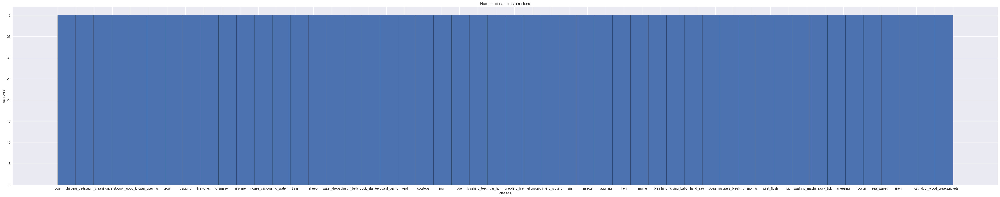

In [4]:
plt.figure(figsize=(55, 10))
plt.title("Number of samples per class")
plt.hist(np.asarray(ds_labels), bins=50, edgecolor='black') 
plt.xlabel("classes")
plt.ylabel("samples")
plt.show()

Transient sound:


Continous sound:


Intermittent sound:


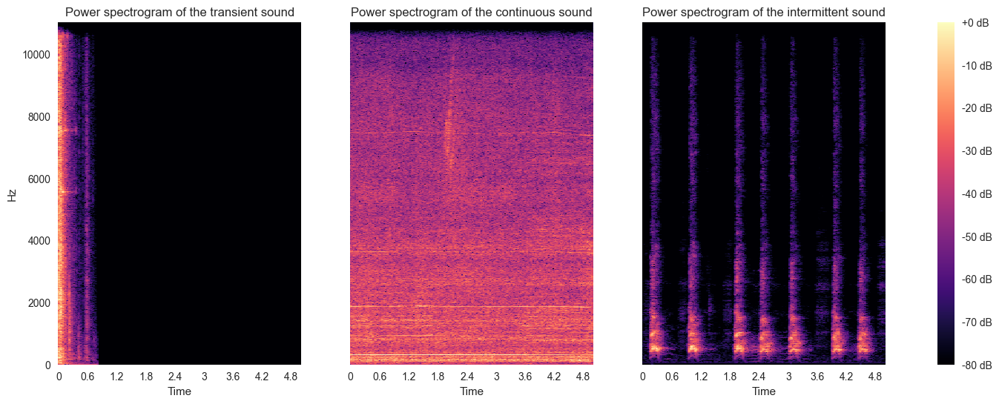

In [5]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-84705-A-39.wav'  # Transient
file1 = path + '1-19872-A-36.wav'  # Continuous
file2 = path + '1-30344-A-0.wav'   # Intermittent

name = ['transient', 'continuous', 'intermittent']

# Show audio player for each file
print('Transient sound:')
IPython.display.display(IPython.display.Audio(data=file0))
print('Continous sound:')
IPython.display.display(IPython.display.Audio(data=file1))
print('Intermittent sound:')
IPython.display.display(IPython.display.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Fra quelli simili si fa confusione: se vuelve loco

Washing machine sound:


Helicopter sound:


Engine sound:


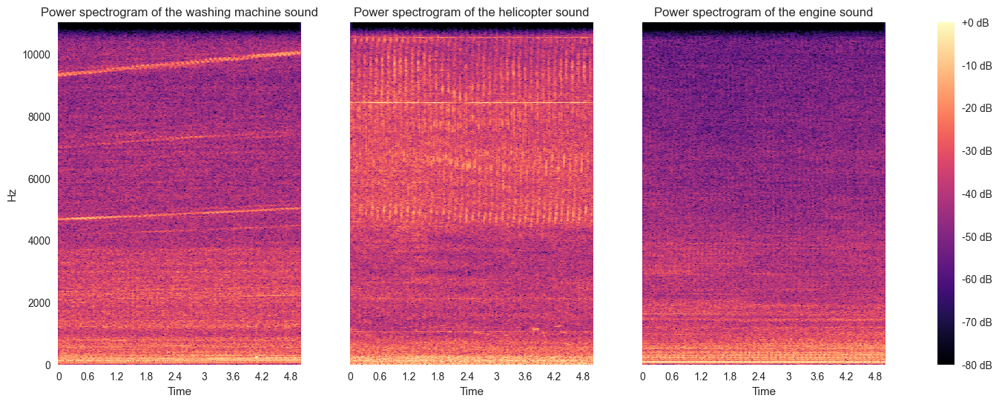

In [81]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-23996-B-35.wav'     # La Lavadora
file1 = path + '1-172649-A-40.wav'    # El helicoptero
file2 = path + '5-232272-A-44.wav'    # El coche


name = ['washing machine', 'helicopter', 'engine']

# Show audio player for each file
print('Washing machine sound:')
IPython.display.display(IPython.display.Audio(data=file0))
print('Helicopter sound:')
IPython.display.display(IPython.display.Audio(data=file1))
print('Engine sound:')
IPython.display.display(IPython.display.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Se vogliamo mettere come c'è un'alta variabilità nella stessa classe. Vogliamo l'abbaio 

First dog sound:


Second dog sound:


Third dog sound:


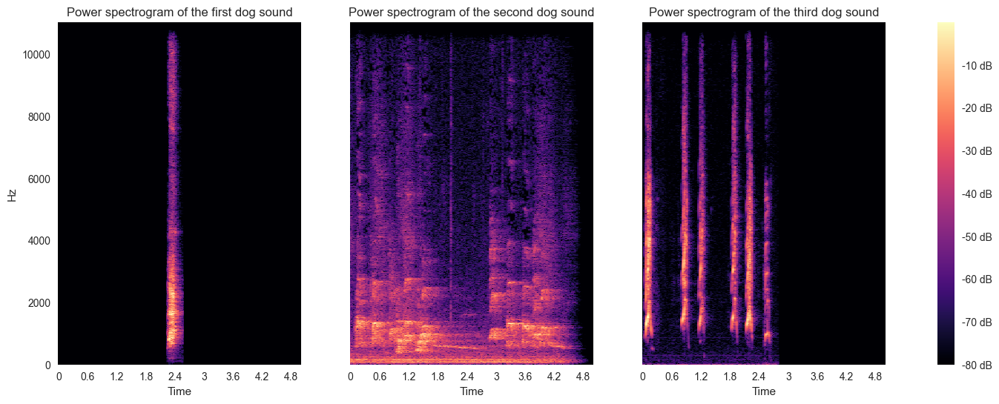

In [7]:
# Setup some filepaths
path = 'ESC-50-master/audio/'
file0 = path + '1-100032-A-0.wav'     # El perro limpio
file1 = path + '3-136288-A-0.wav'     # El perro en la lavadora
file2 = path + '5-9032-A-0.wav'       # El perro sucio

name = ['first dog', 'second dog', 'third dog']

# Show audio player for each file
print('First dog sound:')
IPython.display.display(IPython.display.Audio(data=file0))
print('Second dog sound:')
IPython.display.display(IPython.display.Audio(data=file1))
print('Third dog sound:')
IPython.display.display(IPython.display.Audio(data=file2))

# Plot mel specs
files = [file0, file1, file2]
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
for i in range(3):
  y, sr = librosa.load(files[i])
  D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
  img = librosa.display.specshow(D, y_axis='linear', x_axis='time', sr=sr, ax=ax[i])
  ax[i].set(title='Power spectrogram of the ' + name[i] + ' sound')
  ax[i].label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")
plt.show()

Un'altra cosa da far notare è che non esiste una vera conoscenza e struttura di suoni ambientali ('o ritmo, o suono, 'o mare). Harmonic percussion

Harmonic component


Percussive component


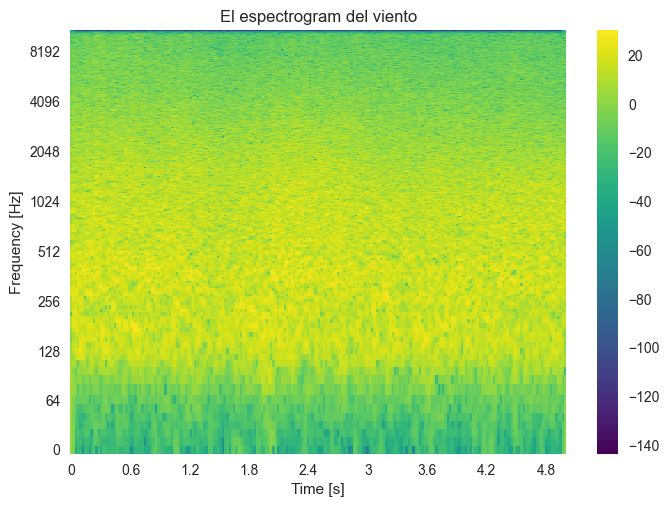

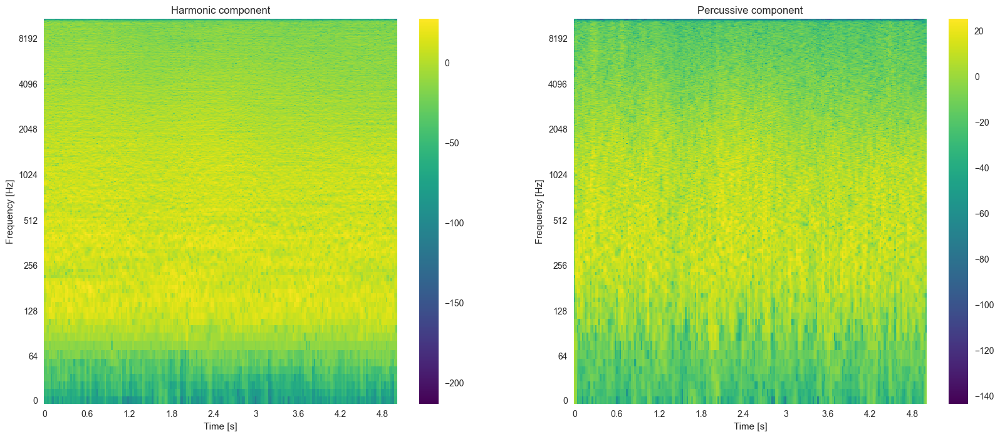

In [ ]:
path = 'ESC-50-master/audio/'
file0 = path + '1-51037-A-16.wav'     # El viento

sound, sr = librosa.load(file0)

S = librosa.stft(sound)

librosa.display.specshow(20*np.log10(np.abs(S)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'El espectrogram del viento')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

Hmm, Prs = librosa.decompose.hpss(S)

plt.figure(figsize=(20,8))

plt.subplot(1, 2, 1)
librosa.display.specshow(20*np.log10(np.abs(Hmm)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Harmonic component')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

plt.subplot(1, 2, 2)
librosa.display.specshow(20*np.log10(np.abs(Prs)+np.finfo(float).eps), sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f'Percussive component')
plt.xlabel('Time [s]')
plt.ylabel('Frequency [Hz]')
plt.colorbar()

print(f'Harmonic component')
IPython.display.display(IPython.display.Audio(librosa.istft(Hmm), rate=sr))
print(f'Percussive component')
IPython.display.display(IPython.display.Audio(librosa.istft(Prs), rate=sr))

# Loading files

Nos cargamos todos los signales

In [93]:
signals = []
audio_folder = "ESC-50-master/audio/"

for file in ds_files:
    filepath = os.path.join(audio_folder, file)
    signal, sr = librosa.load(filepath, sr=None)
    signals.append(signal)

# **CRNN V.1**

Per la creazione del seguente modello abbiamo preso spunto dalla repository github : https://github.com/ksanjeevan/crnn-audio-classification.
Abbiamo layer Conv2D seguiti da 2 layer LSTM bidirezionali. Nella repo è presente un'immagine molto utile per capirne il funzionamento.
Il dataset utilizzato è UrbanSound8k, quindi non bisogna aspettarsi necessariamente gli stessi valori di accurancy della repo, ma è una base promettente sulla quale è possibile fare prove con altri parametri, modificando i layer o l'input in ingresso. Per ora mi sono attenuta a i dettagli tecnici trovati nella repo.

Come input c'è un mel spectrogram normalizzato.

Stranamente è molto veloce a runnare ma non capisco perchè il numero di parametri indicati online è 139,786 contro i nostri che sono 279,218. Ci saranno dunque delle differenze da qualche parte.

Forse potrebbe usare qualche keras.inizializer diverso da quello di default.


## **Feature extraction**

In [21]:
mel_spegrams = []
n_mels = 128
n_fft = 2048
win_length = n_fft
hop_length = win_length // 2

for signal in signals:
    mel_spec = librosa.feature.melspectrogram(y=signal, n_mels=n_mels, hop_length=hop_length, n_fft=n_fft, win_length=win_length)
    mel_spegrams.append(mel_spec)

We can add nomralisation here

In [22]:
scaler = StandardScaler()
mel_spegrams_normalized = []

for mel_spec in mel_spegrams:
    scaler.fit(mel_spec)
    mel_spegrams_normalized.append(scaler.transform(mel_spec))

In [23]:
Xdata = np.asarray(mel_spegrams_normalized)

# Transform the labels to numbers
label_mapping = {label: idx for idx, label in enumerate(dict.fromkeys(ds_labels))}
numerical_labels = np.array([label_mapping[label] for label in ds_labels])

Ydata = np.asarray(numerical_labels) # Aquí, hay todas las clases

print('Xdata shape: {} \nYata shape: {}'.format(Xdata.shape, Ydata.shape))   

Xdata shape: (2000, 128, 108) 
Yata shape: (2000,)


## **Dataset splitting**

In [24]:
train_size = 0.7
val_size = 0.2
test_size = 0.1

seed = 1234
X_train, X_temp, y_train, y_temp = train_test_split(Xdata, Ydata, train_size=train_size, random_state=seed, shuffle=True , stratify=Ydata)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=np.round(test_size/(test_size + val_size),2), random_state=seed, shuffle=True , stratify=y_temp)

Shapes for each partition

In [25]:
print('X_train shape: {} \nX_val shape: {} \nX_test shape: {} \ny_train shape: {} \ny_val shape: {} \ny_test shape: {} \n'.format(X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape))

X_train shape: (1400, 128, 108) 
X_val shape: (402, 128, 108) 
X_test shape: (198, 128, 108) 
y_train shape: (1400,) 
y_val shape: (402,) 
y_test shape: (198,) 



## **Model Definition**

In [26]:
# We expand the data to make them fit the 2D model
X_train_exp = np.expand_dims(X_train, axis=-1)
X_val_exp = np.expand_dims(X_val, axis=-1)
X_test_exp = np.expand_dims(X_test, axis=-1)

print('X_train_exp shape: {} \nX_val_exp shape: {} \nX_test_exp shape: {}'.format(X_train_exp.shape, X_val_exp.shape, X_test_exp.shape))

X_train_exp shape: (1400, 128, 108, 1) 
X_val_exp shape: (402, 128, 108, 1) 
X_test_exp shape: (198, 128, 108, 1)


Una cosa che potrebbe sembrare strana è la presenza di tf.keras.layers.ELU(), non è altro che l'activation function del layer convoluzionale che al posto di essere esplicitata sopra, viene messa dopo. Lo fa per risucire ad applicare la batchnormalization prima dell'activation function. Anche un altro paper che ho letto suggeriva questo approccio

In [27]:
input_shape = (X_train_exp.shape[1], X_train_exp.shape[2], X_train_exp.shape[3]) 
print('INPUT SHAPE:', input_shape)

CRNN_model = tf.keras.models.Sequential()
CRNN_model.add(tf.keras.Input(shape=input_shape))


# --- Conv Block 1 ---
CRNN_model.add(tf.keras.layers.Conv2D(64, kernel_size=3, strides=1, padding='valid'))
CRNN_model.add(tf.keras.layers.BatchNormalization())
CRNN_model.add(tf.keras.layers.ELU())
CRNN_model.add(tf.keras.layers.MaxPooling2D(pool_size=3, strides=3))
CRNN_model.add(tf.keras.layers.Dropout(0.1))

# --- Conv Block 2 ---
CRNN_model.add(tf.keras.layers.Conv2D(64, kernel_size=3, strides=1, padding='valid'))
CRNN_model.add(tf.keras.layers.BatchNormalization())
CRNN_model.add(tf.keras.layers.ELU())
CRNN_model.add(tf.keras.layers.MaxPooling2D(pool_size=4, strides=4))
CRNN_model.add(tf.keras.layers.Dropout(0.1))

# --- Conv Block 3 ---
CRNN_model.add(tf.keras.layers.Conv2D(64, kernel_size=3, strides=1, padding='valid'))
CRNN_model.add(tf.keras.layers.BatchNormalization())
CRNN_model.add(tf.keras.layers.ELU())
CRNN_model.add(tf.keras.layers.MaxPooling2D(pool_size=4, strides=4))
CRNN_model.add(tf.keras.layers.Dropout(0.1))

# --- Reshape for LSTM ---
CRNN_model.add(tf.keras.layers.Permute((2, 1, 3)))  # (batch, time, freq, channels)
CRNN_model.add(tf.keras.layers.Reshape((-1, CRNN_model.output_shape[2] * CRNN_model.output_shape[3])))  # (batch, time, features)

# --- LSTM Block ---
CRNN_model.add(tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64, return_sequences=True)))
CRNN_model.add(tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64, return_sequences=False)))
CRNN_model.add(tf.keras.layers.Dropout(0.3))

# --- Dense output ---
CRNN_model.add(tf.keras.layers.BatchNormalization())
CRNN_model.add(tf.keras.layers.Dense(50, activation='softmax'))

CRNN_model.summary()

INPUT SHAPE: (128, 108, 1)
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 106, 64)      640       
                                                                 
 batch_normalization_16 (Ba  (None, 126, 106, 64)      256       
 tchNormalization)                                               
                                                                 
 elu (ELU)                   (None, 126, 106, 64)      0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 42, 35, 64)        0         
 D)                                                              
                                                                 
 dropout_2 (Dropout)         (None, 42, 35, 64)        0         
                                                                 
 conv2d_1 (Conv2D)         

In [31]:
#Parameters 
step_size = 10
gamma = 0.5
#learning_rate=0.001
#amsgrad=False
learning_rate=0.002
amsgrad=True

# CSVLogger
csv_logger = CSVLogger('CRNN.log', append=False)

# EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=100)

# Model checkpoint
model_name = 'CRNN_model.h5'
model_checkpoint = ModelCheckpoint(model_name, monitor='val_accuracy', save_best_only=True, verbose=1)

# Dynamic Learning rate
def step_decay(epoch):
    return learning_rate * (gamma ** (epoch // step_size))

lr_scheduler = LearningRateScheduler(step_decay)

# Store all these callbacks in a list, Callback list
callbacks = [csv_logger, early_stopping, model_checkpoint, lr_scheduler]

# Compile the model
opt = tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate, amsgrad=amsgrad)
CRNN_model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [32]:
#batch_size = 32
batch_size = 24

history_CRNN = CRNN_model.fit(X_train_exp, y_train, batch_size=batch_size, epochs=300, validation_data=(X_val_exp, y_val), callbacks=callbacks) 

Epoch 1/300


2025-05-30 12:24:57.168040: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:24:57.595431: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:24:57.609477: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:24:57.663670: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:24:57.676083: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:24:57.849889: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:24:57.868496: I tensorflow/core/grappler/optimizers/cust

59/59 [==============================] - ETA: 0s - loss: 2.9472 - accuracy: 0.1971

2025-05-30 12:25:04.532323: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:25:04.688969: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:25:04.698032: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:25:04.750861: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:25:04.760490: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.



Epoch 1: val_accuracy improved from -inf to 0.12189, saving model to CRNN_model.h5
59/59 [==============================] - 9s 122ms/step - loss: 2.9472 - accuracy: 0.1971 - val_loss: 3.7510 - val_accuracy: 0.1219 - lr: 0.0020
Epoch 2/300
 1/59 [..............................] - ETA: 6s - loss: 2.2484 - accuracy: 0.3333

/opt/anaconda3/envs/Ti_prego_vai_pi_veloce/lib/python3.8/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


59/59 [==============================] - ETA: 0s - loss: 2.5526 - accuracy: 0.2707
Epoch 2: val_accuracy improved from 0.12189 to 0.16418, saving model to CRNN_model.h5
59/59 [==============================] - 6s 104ms/step - loss: 2.5526 - accuracy: 0.2707 - val_loss: 3.5950 - val_accuracy: 0.1642 - lr: 0.0020
Epoch 3/300
59/59 [==============================] - ETA: 0s - loss: 2.3234 - accuracy: 0.3257
Epoch 3: val_accuracy did not improve from 0.16418
59/59 [==============================] - 6s 109ms/step - loss: 2.3234 - accuracy: 0.3257 - val_loss: 3.3956 - val_accuracy: 0.1592 - lr: 0.0020
Epoch 4/300
58/59 [============================>.] - ETA: 0s - loss: 2.1426 - accuracy: 0.3657
Epoch 4: val_accuracy improved from 0.16418 to 0.20896, saving model to CRNN_model.h5
59/59 [==============================] - 6s 108ms/step - loss: 2.1410 - accuracy: 0.3657 - val_loss: 3.0931 - val_accuracy: 0.2090 - lr: 0.0020
Epoch 5/300
58/59 [============================>.] - ETA: 0s - loss: 1.9

## **Evaluation**

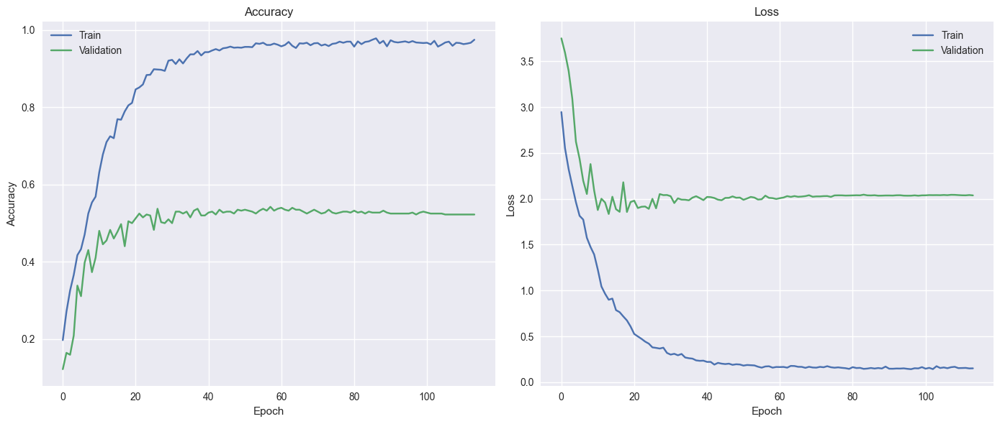

Best validation accuracy: 0.5422885417938232


In [33]:
log_df = pd.read_csv('CRNN.log')

plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(log_df['epoch'], log_df['accuracy'], label='Train')
plt.plot(log_df['epoch'], log_df['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(log_df['epoch'], log_df['loss'], label='Train')
plt.plot(log_df['epoch'], log_df['val_loss'], label='Validation')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

best_acc = log_df['val_accuracy'].max()
print('Best validation accuracy:', best_acc)

In [35]:
CRNN_model.load_weights('CRNN_model.h5')
[loss_test_C2D, acc_test_C2D] = CRNN_model.evaluate(X_test_exp, y_test, verbose=0)
print(f"Test loss: {loss_test_C2D}")
print(f"Test accuracy: {acc_test_C2D}")

Test loss: 2.076655387878418
Test accuracy: 0.5151515007019043


2025-05-30 12:39:26.801736: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:39:26.964685: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:39:26.974997: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


 3/13 [=====>........................] - ETA: 0s

2025-05-30 12:39:27.033466: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:39:27.044316: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


7/7 [==============================] - 0s 28ms/step


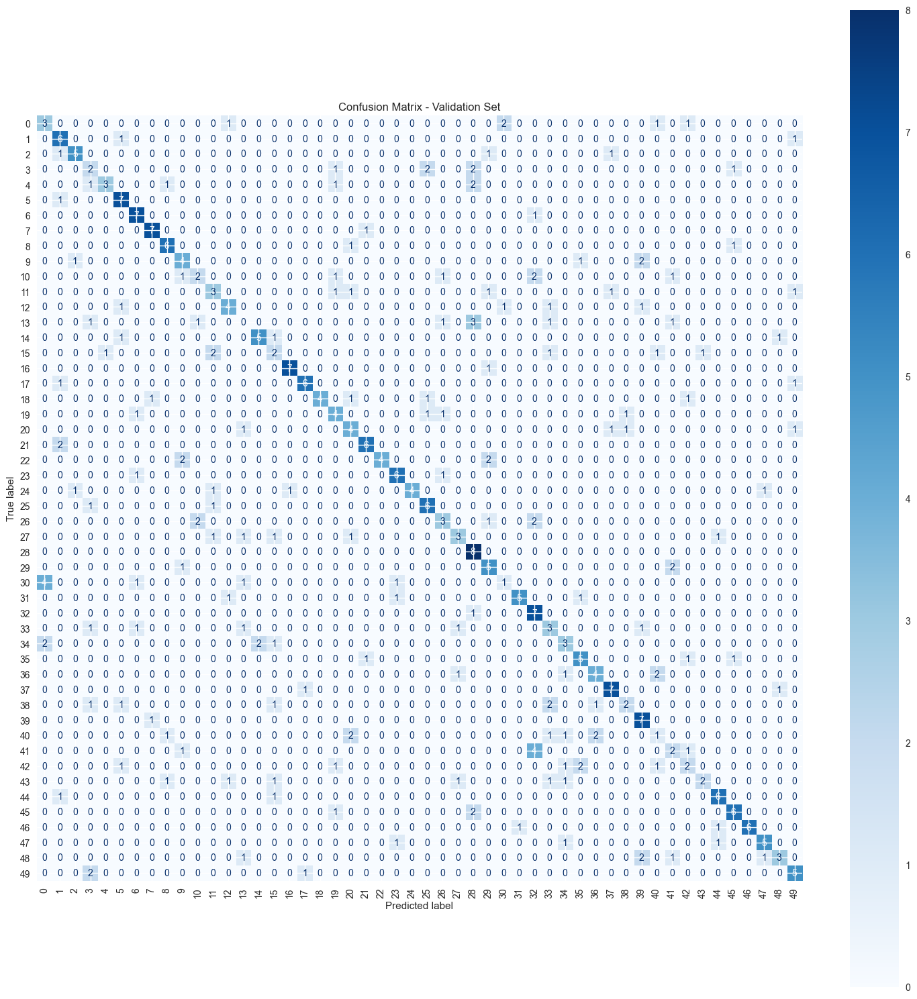

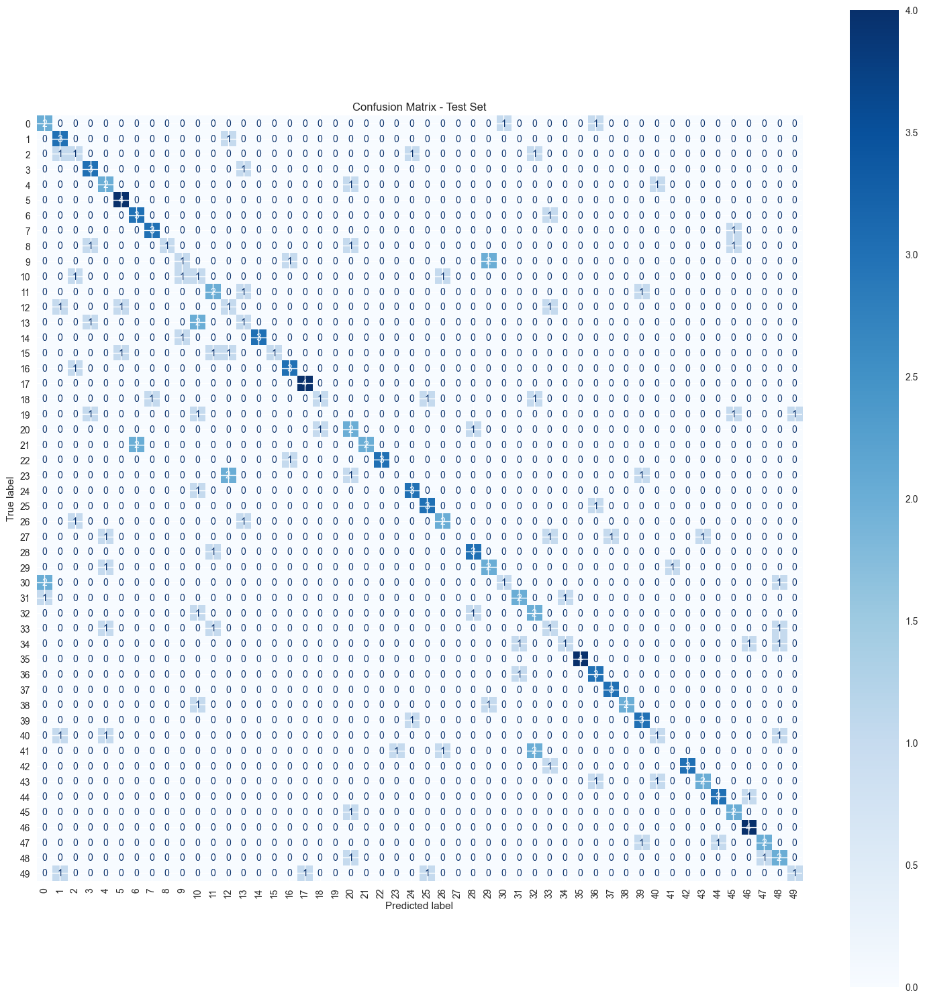

In [36]:
possible_classes = np.arange(0, 50)

pred_val = CRNN_model.predict(X_val_exp)
pred_test = CRNN_model.predict(X_test_exp)

pred_val_classes = np.argmax(pred_val, axis=1)
pred_test_classes = np.argmax(pred_test, axis=1)

# Confusion Matrix - Validation
cm_val = confusion_matrix(y_val, pred_val_classes)
fig_val, ax_val = plt.subplots(figsize=(15, 15))  
disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val, display_labels=possible_classes)
disp_val.plot(cmap=plt.cm.Blues, ax=ax_val, xticks_rotation=90)
ax_val.set_title('Confusion Matrix - Validation Set')
plt.tight_layout()
plt.show()

# Confusion Matrix - Test
cm_test = confusion_matrix(y_test, pred_test_classes)
fig_test, ax_test = plt.subplots(figsize=(15, 15))
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=possible_classes)
disp_test.plot(cmap=plt.cm.Blues, ax=ax_test, xticks_rotation=90)
ax_test.set_title('Confusion Matrix - Test Set')
plt.tight_layout()
plt.show()


In [37]:
print(classification_report(y_val, pred_val_classes, zero_division=0))

              precision    recall  f1-score   support

           0       0.33      0.38      0.35         8
           1       0.50      0.75      0.60         8
           2       0.71      0.62      0.67         8
           3       0.22      0.25      0.24         8
           4       0.75      0.38      0.50         8
           5       0.58      0.88      0.70         8
           6       0.64      0.88      0.74         8
           7       0.78      0.88      0.82         8
           8       0.67      0.75      0.71         8
           9       0.44      0.50      0.47         8
          10       0.40      0.25      0.31         8
          11       0.38      0.38      0.38         8
          12       0.57      0.50      0.53         8
          13       0.00      0.00      0.00         8
          14       0.71      0.62      0.67         8
          15       0.25      0.25      0.25         8
          16       0.88      0.88      0.88         8
          17       0.75    

In [38]:
print(classification_report(y_test, pred_test_classes, zero_division=0))

              precision    recall  f1-score   support

           0       0.40      0.50      0.44         4
           1       0.43      0.75      0.55         4
           2       0.25      0.25      0.25         4
           3       0.50      0.75      0.60         4
           4       0.33      0.50      0.40         4
           5       0.67      1.00      0.80         4
           6       0.60      0.75      0.67         4
           7       0.75      0.75      0.75         4
           8       1.00      0.25      0.40         4
           9       0.33      0.25      0.29         4
          10       0.14      0.25      0.18         4
          11       0.40      0.50      0.44         4
          12       0.20      0.25      0.22         4
          13       0.25      0.25      0.25         4
          14       1.00      0.75      0.86         4
          15       1.00      0.25      0.40         4
          16       0.60      0.75      0.67         4
          17       0.80    

# **CRNN V.2**

Qui abbiamo replicato la proposta del paper **"Convolutional Recurrent Neural Networks for Urban Sound Classification using Raw Waveforms"**, presente nella cartella CRNN sulla nostra repo.

Viene proposta sempre una CRNN ma si utilizzano CONV1D e sempre due layer LSTM. Anche qui bisogna sottolinerare che per lo sviluppo del modello è stato usato come dataset UrbanSound8k.

La particolarità è che come input si utilizza la "raw waveform", quindi si evita una estrazione di feature, le uniche operazioni necessarie sono downsampling e normalizzazione. In ogni caso può essere utile testare questa stessa architettura con altre varianti e anche altri input.

A differenza del modello CRNN v.1, non è stato possibile (almeno a me Chiara...) testare il modello cosi come presentato dal paper, è compresibile perchè abbiamo ben 2 milioni di parametri! Questo è coerente con quello che dice il paper ma evidentemente quei ricercatori avano pc migliori.
Possiamo decidere di modificare, vedere se provare su Colab o far provare ad Anna con Intel ahaha

Aggiornamento:
- Anche ad Anna va lento
- Colab non va bene
- Possiamo provare Kaggle
- Può provare Francesca

## **Feature Extraction**

In [10]:
def preprocess_signals(signals, sample_rate, target_sr=8000, target_len=40000):
    processed_signals = []

    for signal in signals:
        
        if sample_rate != target_sr:
            signal = librosa.resample(signal, orig_sr=sample_rate, target_sr=target_sr)

        
        if signal.ndim > 1:
            signal = np.mean(signal, axis=1)

        
        if len(signal) < target_len:
            pad = target_len - len(signal)
            signal = np.pad(signal, (0, pad), mode='constant')
        else:
            signal = signal[:target_len]

        
        signal = (signal - np.mean(signal)) / (np.std(signal) + 1e-8)


        processed_signals.append(signal)

    return processed_signals



In [11]:
Data_CRNN2 = preprocess_signals(signals, sr)
Xdata = np.asarray(Data_CRNN2)

# Transform the labels to numbers
label_mapping = {label: idx for idx, label in enumerate(dict.fromkeys(ds_labels))}
numerical_labels = np.array([label_mapping[label] for label in ds_labels])

Ydata = np.asarray(numerical_labels) # Aquí, hay todas las clases

print('Xdata shape: {} \nYata shape: {}'.format(Xdata.shape, Ydata.shape)) 

Xdata shape: (2000, 40000) 
Yata shape: (2000,)


In [12]:
train_size = 0.7
val_size = 0.2
test_size = 0.1

seed = 1234
X_train, X_temp, y_train, y_temp = train_test_split(Xdata, Ydata, train_size=train_size, random_state=seed, shuffle=True , stratify=Ydata)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=np.round(test_size/(test_size + val_size),2), random_state=seed, shuffle=True , stratify=y_temp)

print('X_train shape: {} \nX_val shape: {} \nX_test shape: {} \ny_train shape: {} \ny_val shape: {} \ny_test shape: {} \n'.format(X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape))

X_train shape: (1400, 40000) 
X_val shape: (402, 40000) 
X_test shape: (198, 40000) 
y_train shape: (1400,) 
y_val shape: (402,) 
y_test shape: (198,) 



## **Model Definition**

In [13]:
X_train_exp = np.expand_dims(X_train, axis=-1)
X_val_exp = np.expand_dims(X_val, axis=-1)
X_test_exp = np.expand_dims(X_test, axis=-1)

print('X_train_exp shape: {} \nX_val_exp shape: {} \nX_test_exp shape: {}'.format(X_train_exp.shape, X_val_exp.shape, X_test_exp.shape))

X_train_exp shape: (1400, 40000, 1) 
X_val_exp shape: (402, 40000, 1) 
X_test_exp shape: (198, 40000, 1)


In [15]:
input_shape=(X_train_exp.shape[1], X_train_exp.shape[2])
print('INPUT SHAPE:', input_shape)

CRNN2_model = tf.keras.models.Sequential()
CRNN2_model.add(tf.keras.Input(shape=input_shape))

glorot = tf.keras.initializers.GlorotUniform(seed=42) #Xavier 

# 1. Prima convoluzione (copre 10ms → 80 campioni a 8kHz)
CRNN2_model.add(tf.keras.layers.Conv1D(64, kernel_size=80, strides=4, padding='valid',
                        kernel_initializer=glorot))
CRNN2_model.add(tf.keras.layers.BatchNormalization())
CRNN2_model.add(tf.keras.layers.ReLU())
CRNN2_model.add(tf.keras.layers.MaxPooling1D(pool_size=4, strides=1))

# 2. Conv (64, 3)             
CRNN2_model.add(tf.keras.layers.Conv1D(64, kernel_size=3, strides=1, padding='valid',
                        kernel_initializer=glorot))
CRNN2_model.add(tf.keras.layers.BatchNormalization())
CRNN2_model.add(tf.keras.layers.ReLU())
CRNN2_model.add(tf.keras.layers.MaxPooling1D(pool_size=4, strides=1))

# 3. Conv (128, 3) × 2
CRNN2_model.add(tf.keras.layers.Conv1D(128, kernel_size=3, strides=1, padding='valid',
                        kernel_initializer=glorot))
CRNN2_model.add(tf.keras.layers.BatchNormalization())
CRNN2_model.add(tf.keras.layers.ReLU())

CRNN2_model.add(tf.keras.layers.Conv1D(128, kernel_size=3, strides=1, padding='valid',
                        kernel_initializer=glorot))
CRNN2_model.add(tf.keras.layers.BatchNormalization())
CRNN2_model.add(tf.keras.layers.ReLU())

CRNN2_model.add(tf.keras.layers.MaxPooling1D(pool_size=4, strides=1))

# 4. Conv (256, 3) × 2
CRNN2_model.add(tf.keras.layers.Conv1D(256, kernel_size=3, strides=1, padding='valid',
                        kernel_initializer=glorot))
CRNN2_model.add(tf.keras.layers.BatchNormalization())
CRNN2_model.add(tf.keras.layers.ReLU())

CRNN2_model.add(tf.keras.layers.Conv1D(256, kernel_size=3, strides=1, padding='valid',
                        kernel_initializer=glorot))
CRNN2_model.add(tf.keras.layers.BatchNormalization())
CRNN2_model.add(tf.keras.layers.ReLU())

CRNN2_model.add(tf.keras.layers.MaxPooling1D(pool_size=4, strides=1))

# 5. Conv (512, 3) × 2
CRNN2_model.add(tf.keras.layers.Conv1D(512, kernel_size=3, strides=1, padding='valid',
                        kernel_initializer=glorot))
CRNN2_model.add(tf.keras.layers.BatchNormalization())
CRNN2_model.add(tf.keras.layers.ReLU())

CRNN2_model.add(tf.keras.layers.Conv1D(512, kernel_size=3, strides=1, padding='valid',
                        kernel_initializer=glorot))
CRNN2_model.add(tf.keras.layers.BatchNormalization())
CRNN2_model.add(tf.keras.layers.ReLU())

CRNN2_model.add(tf.keras.layers.MaxPooling1D(pool_size=4, strides=1))

# Dropout solo prima dell'RNN
CRNN2_model.add(tf.keras.layers.Dropout(0.1))

# 6. LSTM × 2 (many-to-one)
CRNN2_model.add(tf.keras.layers.LSTM(128, return_sequences=True))
CRNN2_model.add(tf.keras.layers.LSTM(128, return_sequences=False))

# 7. Fully connected
CRNN2_model.add(tf.keras.layers.Dense(50, activation='softmax'))

CRNN2_model.summary()

INPUT SHAPE: (40000, 1)
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_8 (Conv1D)           (None, 9981, 64)          5184      
                                                                 
 batch_normalization_8 (Bat  (None, 9981, 64)          256       
 chNormalization)                                                
                                                                 
 re_lu_8 (ReLU)              (None, 9981, 64)          0         
                                                                 
 max_pooling1d_5 (MaxPoolin  (None, 9978, 64)          0         
 g1D)                                                            
                                                                 
 conv1d_9 (Conv1D)           (None, 9976, 64)          12352     
                                                                 
 batch_normalization_9 (Bat  (

In [19]:
#Parameters 
learning_rate=0.001
amsgrad=False

# CSVLogger
csv_logger = CSVLogger('CRNN2.log', append=False)

# EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=100)

# Model checkpoint
model_name = 'CRNN2_model.h5'
model_checkpoint = ModelCheckpoint(model_name, monitor='val_accuracy', save_best_only=True, verbose=1)

# Store all these callbacks in a list, Callback list
callbacks = [csv_logger, early_stopping, model_checkpoint]

# Compile the model
opt = tf.keras.optimizers.legacy.Adam(learning_rate=learning_rate, amsgrad=amsgrad)
CRNN2_model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [20]:
batch_size = 32

history_CRNN2 = CRNN2_model.fit(X_train_exp, y_train, batch_size=batch_size, epochs=300, validation_data=(X_val_exp, y_val), callbacks=callbacks)

Epoch 1/300


2025-05-30 12:19:15.139372: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:19:16.327573: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:19:17.471221: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:19:18.606261: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 12:19:18.887197: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


38/44 [========================>.....] - ETA: 34s - loss: 3.6912 - accuracy: 0.0559

KeyboardInterrupt: 

# **CRNN V.3**

Per la costruzione di questo modello ci siamo basati sul paper **"Attention based convolutional recurrent neural network for
environmental sound classification"**. Gli stessi autori hanno usato ESC-50 come dataset, per questo motivo è il modello sul quale puntiamo di più.

La base è sempre layer Conv2D e componente RNN, solo che si utilizza un GRU (2 layer bidirezionali). 

Una delle principali caratteristiche è l'utilizzo del log gammatone spectrogram, che si è rivelato migliore del log mel spectrogram, come input iniziale. La scelta degli autori è stata anche quella di dividere in parti l'input, infatti la classificazione viene fatta su questi segmenti che poi devono essere messi insieme fuori dalla rete per ricavare i reali valori di accurancy. Come feature aggiuntiva viene calcolato anche il delta sui log gammatone.

L'altro punto centrale è "l'Attention Mechanism" (vedi paper per i dettagli), l'idea principale è quella di assegnare dei pesi diversi ai diversi frame che compongono un audio, non tutti sono informativi allo stesso modo per la rete (pensiamo alla presenza di silenzio o rumore).
Per ora è stata implementata solo la parte di Attention Mechanism realtiva alla parte RNN, si potrebbe implementare anche quella per il layer convoluzionali.



## **Feature Extraction**

In [39]:
!pip install gammatone

In [99]:
from gammatone.gtgram import gtgram

def extract_segments_from_signal(signal, sr=44100, win_time=0.023, hop_time=0.0115, n_filters=128, segment_frames=128, hop_frames=64):
    """
    Estrae segmenti (128, 128, 2) da un segnale audio per il modello ACRNN.

    Args:
        signal (np.ndarray): segnale audio mono.
        sr (int): frequenza di campionamento (default 44100 Hz).
        win_time (float): durata della finestra per STFT (23 ms).
        hop_time (float): hop tra i frame (11.5 ms ≈ 50% overlap).
        n_filters (int): numero di bande gammatone.
        segment_frames (int): lunghezza di ogni segmento in frame (default 128).
        hop_frames (int): passo tra i segmenti (default 64 = 50% overlap).

    Returns:
        segments: lista di array (128, 128, 2)
    """
    
    gt = gtgram(signal, sr, win_time, hop_time, n_filters, 50)
    gt_log = 10 * np.log10(gt + 1e-10)  # log-scale

   
    delta = librosa.feature.delta(gt_log)

    total_frames = gt_log.shape[1]
    segments = []
    for start in range(0, total_frames - segment_frames + 1, hop_frames):
        end = start + segment_frames
        segment_gt = gt_log[:, start:end]
        segment_delta = delta[:, start:end]
        segment = np.stack([segment_gt, segment_delta], axis=-1)  # shape: (128, 128, 2)
        segments.append(segment)

    return segments


In [ ]:
#ancora da controllare se il numero di segmenti torna
from tqdm import tqdm

all_segments = []
all_labels = []

for signal, label in tqdm(zip(signals, ds_labels), total=len(signals)):
    segments = extract_segments_from_signal(signal, sr)
    all_segments.extend(segments)
    all_labels.extend([label] * len(segments))  # Replichiamo la label


Xdata = np.asarray(all_segments)  # shape: (num_segments, 128, 128, 2)

# Transform the labels to numbers
label_mapping = {label: idx for idx, label in enumerate(dict.fromkeys(ds_labels))}
numerical_labels = np.array([label_mapping[label] for label in all_labels])

Ydata = np.asarray(numerical_labels) # Aquí, hay todas las clases

print('Xdata shape: {} \nYata shape: {}'.format(Xdata.shape, Ydata.shape)) 

100%|██████████| 2000/2000 [26:17<00:00,  1.27it/s]


Xdata shape: (10000, 128, 128, 2) 
Yata shape: (10000,)


In [102]:
train_size = 0.7
val_size = 0.2
test_size = 0.1

seed = 1234
X_train, X_temp, y_train, y_temp = train_test_split(Xdata, Ydata, train_size=train_size, random_state=seed, shuffle=True , stratify=Ydata)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=np.round(test_size/(test_size + val_size),2), random_state=seed, shuffle=True , stratify=y_temp)

print('X_train shape: {} \nX_val shape: {} \nX_test shape: {} \ny_train shape: {} \ny_val shape: {} \ny_test shape: {} \n'.format(X_train.shape, X_val.shape, X_test.shape, y_train.shape, y_val.shape, y_test.shape))

X_train shape: (7000, 128, 128, 2) 
X_val shape: (2010, 128, 128, 2) 
X_test shape: (990, 128, 128, 2) 
y_train shape: (7000,) 
y_val shape: (2010,) 
y_test shape: (990,) 



In [103]:
#Both the training and testing features are normalized by the global mean and stardard deviation of the training set."

# Reshape in 2D per lo scaler: (num_samples, features)
X_train_flat = X_train.reshape(-1, X_train.shape[-1])  # shape: (N * time * freq, channels)

scaler = StandardScaler()
X_train_flat = scaler.fit_transform(X_train_flat)

# Applica la trasformazione al test set
X_val_flat = X_val.reshape(-1, X_val.shape[-1])
X_val_flat = scaler.transform(X_val_flat)

# Applica la trasformazione al test set
X_test_flat = X_test.reshape(-1, X_test.shape[-1])
X_test_flat = scaler.transform(X_test_flat)

# Ripristina la shape originale
X_train_norm = X_train_flat.reshape(X_train.shape)
X_val_norm = X_val_flat.reshape(X_val.shape)
X_test_norm = X_test_flat.reshape(X_test.shape)

print('X_train_norm shape: {} \nX_val_norm shape: {} \nX_test_norm shape: {} \ny_train shape: {} \ny_val shape: {} \ny_test shape: {} \n'.format(X_train_norm.shape, X_val_norm.shape, X_test_norm.shape, y_train.shape, y_val.shape, y_test.shape))


X_train_norm shape: (7000, 128, 128, 2) 
X_val_norm shape: (2010, 128, 128, 2) 
X_test_norm shape: (990, 128, 128, 2) 
y_train shape: (7000,) 
y_val shape: (2010,) 
y_test shape: (990,) 



## **Model Definition**

In [104]:
class FrameAttention(tf.keras.layers.Layer):
    def __init__(self, feature_dim, **kwargs):
        super(FrameAttention, self).__init__(**kwargs)
        self.feature_dim = feature_dim
        self.score_dense = tf.keras.layers.Dense(1, activation='tanh')

    def call(self, inputs):
        # inputs: (batch, time, feature_dim)
        scores = self.score_dense(inputs)                     # (batch, time, 1)
        scores = tf.keras.layers.Flatten()(scores)                            # (batch, time)
        weights = tf.keras.layers.Activation('softmax')(scores)               # (batch, time)
        weights = tf.keras.layers.RepeatVector(self.feature_dim)(weights)     # (batch, feature_dim, time)
        weights = tf.keras.layers.Permute([2, 1])(weights)                    # (batch, time, feature_dim)
        weighted = tf.keras.layers.Multiply()([inputs, weights])              # (batch, time, feature_dim)
        output = tf.keras.layers.Lambda(lambda z: tf.reduce_sum(z, axis=1))(weighted)  # (batch, feature_dim)
        return output


In [105]:
input_shape=(X_train_norm.shape[1], X_train_norm.shape[2], X_train_norm.shape[3] )
print('INPUT SHAPE:', input_shape)

CRNN3_model = tf.keras.models.Sequential()
CRNN3_model.add(tf.keras.Input(shape=input_shape))

init = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.05, seed=42)

# l1-l2: 32 filters, kernel (3,5), stride (1,1), MaxPool (4,3) stride (4,3)
CRNN3_model.add(tf.keras.layers.Conv2D(32, (3, 5), strides=1, activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.L2(0.0001), kernel_initializer=init))
CRNN3_model.add(tf.keras.layers.Conv2D(32, (3, 5), strides=1, activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.L2(0.0001), kernel_initializer=init))
CRNN3_model.add(tf.keras.layers.BatchNormalization())
CRNN3_model.add(tf.keras.layers.MaxPooling2D(pool_size=(4, 3), strides=(4, 3)))

# l3-l4: 64 filters, kernel (3,1), MaxPool (4,1), stride (4,1)
CRNN3_model.add(tf.keras.layers.Conv2D(64, (3, 1), strides=1, activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.L2(0.0001), kernel_initializer=init))
CRNN3_model.add(tf.keras.layers.Conv2D(64, (3, 1), strides=1, activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.L2(0.0001), kernel_initializer=init))
CRNN3_model.add(tf.keras.layers.BatchNormalization())
CRNN3_model.add(tf.keras.layers.MaxPooling2D(pool_size=(4, 1), strides=(4, 1)))

# l5-l6: 128 filters, kernel (1,5), MaxPool (1,3), stride (1,3)
CRNN3_model.add(tf.keras.layers.Conv2D(128, (1, 5), strides=1, activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.L2(0.0001), kernel_initializer=init))
CRNN3_model.add(tf.keras.layers.Conv2D(128, (1, 5), strides=1, activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.L2(0.0001), kernel_initializer=init))
CRNN3_model.add(tf.keras.layers.BatchNormalization())
CRNN3_model.add(tf.keras.layers.MaxPooling2D(pool_size=(1, 3), strides=(1, 3)))

# l7-l8: 256 filters, kernel (3,3), MaxPool (2,2), stride (2,2)
CRNN3_model.add(tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.L2(0.0001), kernel_initializer=init))
CRNN3_model.add(tf.keras.layers.Conv2D(256, (3, 3), strides=1, activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.L2(0.0001), kernel_initializer=init))
CRNN3_model.add(tf.keras.layers.BatchNormalization())
CRNN3_model.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

# --- Reshape to sequence ---
CRNN3_model.add(tf.keras.layers.Permute((2, 1, 3)))  # (batch, time, freq, channels)
CRNN3_model.add(tf.keras.layers.Reshape((-1, CRNN3_model.output_shape[2] * CRNN3_model.output_shape[3])))  # (batch, time, features)

# --- Bi-GRU ---
CRNN3_model.add(tf.keras.layers.Bidirectional(tf.keras.layers.GRU(256, return_sequences=True, dropout=0.5,
                                          kernel_regularizer=tf.keras.regularizers.L2(0.0001), kernel_initializer=init)))
CRNN3_model.add(tf.keras.layers.Bidirectional(tf.keras.layers.GRU(256, return_sequences=True, dropout=0.5,
                                          kernel_regularizer=tf.keras.regularizers.L2(0.0001), kernel_initializer=init)))

# --- Attention ---
CRNN3_model.add(FrameAttention(feature_dim=512))  # 256 x 2 da Bi-GRU

# --- Classificatore ---
CRNN3_model.add(tf.keras.layers.Dense(50, activation='softmax',kernel_initializer=init))

CRNN3_model.summary()

INPUT SHAPE: (128, 128, 2)
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 128, 128, 32)      992       
                                                                 
 conv2d_37 (Conv2D)          (None, 128, 128, 32)      15392     
                                                                 
 batch_normalization_36 (Ba  (None, 128, 128, 32)      128       
 tchNormalization)                                               
                                                                 
 max_pooling2d_19 (MaxPooli  (None, 32, 42, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_38 (Conv2D)          (None, 32, 42, 64)        6208      
                                                                 
 conv2d_39 (Conv2D)       

In [106]:
#Parameters 
learning_rate=0.01
momentum = 0.9
nesterov=True

# CSVLogger
csv_logger = CSVLogger('CRNN3.log', append=False)

# EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=100)

# Model checkpoint
model_name = 'CRNN3_model.h5'
model_checkpoint = ModelCheckpoint(model_name, monitor='val_accuracy', save_best_only=True, verbose=1)

# Dynamic Learning rate
def step_decay(epoch):
    return learning_rate * (0.1 ** (epoch // 100))

lr_scheduler = LearningRateScheduler(step_decay)

# Store all these callbacks in a list, Callback list
callbacks = [csv_logger, early_stopping, model_checkpoint, lr_scheduler]

# Compile the model
optimizer = tf.keras.optimizers.legacy.SGD(learning_rate=learning_rate, momentum=momentum, nesterov=nesterov)
CRNN3_model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [107]:
batch_size = 64

history_CRNN3 = CRNN3_model.fit(X_train_norm, y_train, batch_size=batch_size, epochs=300, validation_data=(X_val_norm, y_val), callbacks=callbacks)

Epoch 1/300


2025-05-30 19:26:48.162598: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 19:26:50.650640: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 19:26:50.662058: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 19:26:50.830246: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 19:26:50.841552: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 19:26:53.038955: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 19:26:53.057921: I tensorflow/core/grappler/optimizers/cust

110/110 [==============================] - ETA: 0s - loss: 17.3820 - accuracy: 0.0583

2025-05-30 19:27:14.394312: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 19:27:14.624131: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 19:27:14.635016: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 19:27:14.694673: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 19:27:14.702901: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.



Epoch 1: val_accuracy improved from -inf to 0.03781, saving model to CRNN3_model.h5


/opt/anaconda3/envs/Ti_prego_vai_pi_veloce/lib/python3.8/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


110/110 [==============================] - 31s 200ms/step - loss: 17.3820 - accuracy: 0.0583 - val_loss: 12.5443 - val_accuracy: 0.0378 - lr: 0.0100
Epoch 2/300
110/110 [==============================] - ETA: 0s - loss: 9.8810 - accuracy: 0.0724
Epoch 2: val_accuracy improved from 0.03781 to 0.04129, saving model to CRNN3_model.h5
110/110 [==============================] - 18s 160ms/step - loss: 9.8810 - accuracy: 0.0724 - val_loss: 10.0165 - val_accuracy: 0.0413 - lr: 0.0100
Epoch 3/300
110/110 [==============================] - ETA: 0s - loss: 8.8569 - accuracy: 0.0850
Epoch 3: val_accuracy did not improve from 0.04129
110/110 [==============================] - 17s 156ms/step - loss: 8.8569 - accuracy: 0.0850 - val_loss: 9.4621 - val_accuracy: 0.0289 - lr: 0.0100
Epoch 4/300
110/110 [==============================] - ETA: 0s - loss: 7.4078 - accuracy: 0.1044
Epoch 4: val_accuracy improved from 0.04129 to 0.05821, saving model to CRNN3_model.h5
110/110 [==============================]

## **Evaluation**

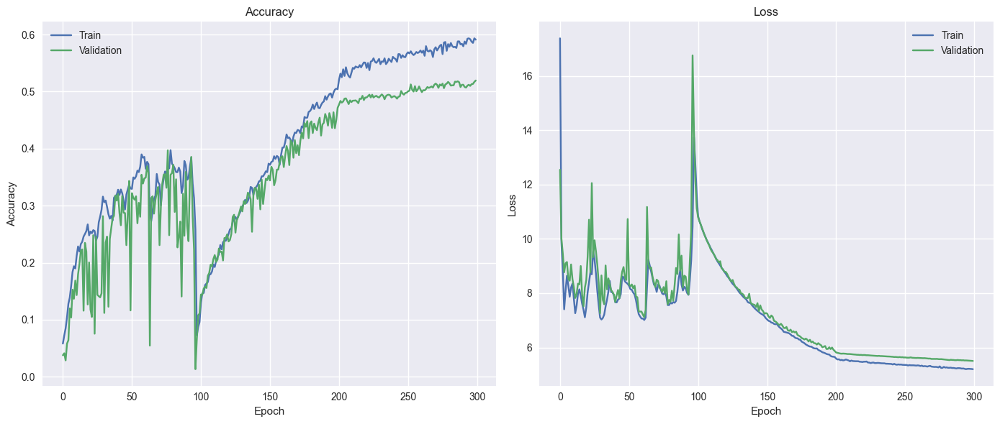

Best validation accuracy: 0.5194029808044434


In [108]:
log_df = pd.read_csv('CRNN3.log')

plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(log_df['epoch'], log_df['accuracy'], label='Train')
plt.plot(log_df['epoch'], log_df['val_accuracy'], label='Validation')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(log_df['epoch'], log_df['loss'], label='Train')
plt.plot(log_df['epoch'], log_df['val_loss'], label='Validation')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

best_acc = log_df['val_accuracy'].max()
print('Best validation accuracy:', best_acc)

In [110]:
#in realtà manca ancora la parte di aggregazione dei segmenti
CRNN3_model.load_weights('CRNN3_model.h5')
[loss_test, acc_test] = CRNN3_model.evaluate(X_test_norm, y_test, verbose=0)
print(f"Test loss: {loss_test}")
print(f"Test accuracy: {acc_test}")

Test loss: 5.569559097290039
Test accuracy: 0.5181818008422852


2025-05-30 21:54:14.214804: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 21:54:14.387755: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 21:54:14.395984: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


 3/63 [>.............................] - ETA: 2s 

2025-05-30 21:54:14.471320: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.
2025-05-30 21:54:14.479521: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


31/31 [==============================] - 1s 30ms/step


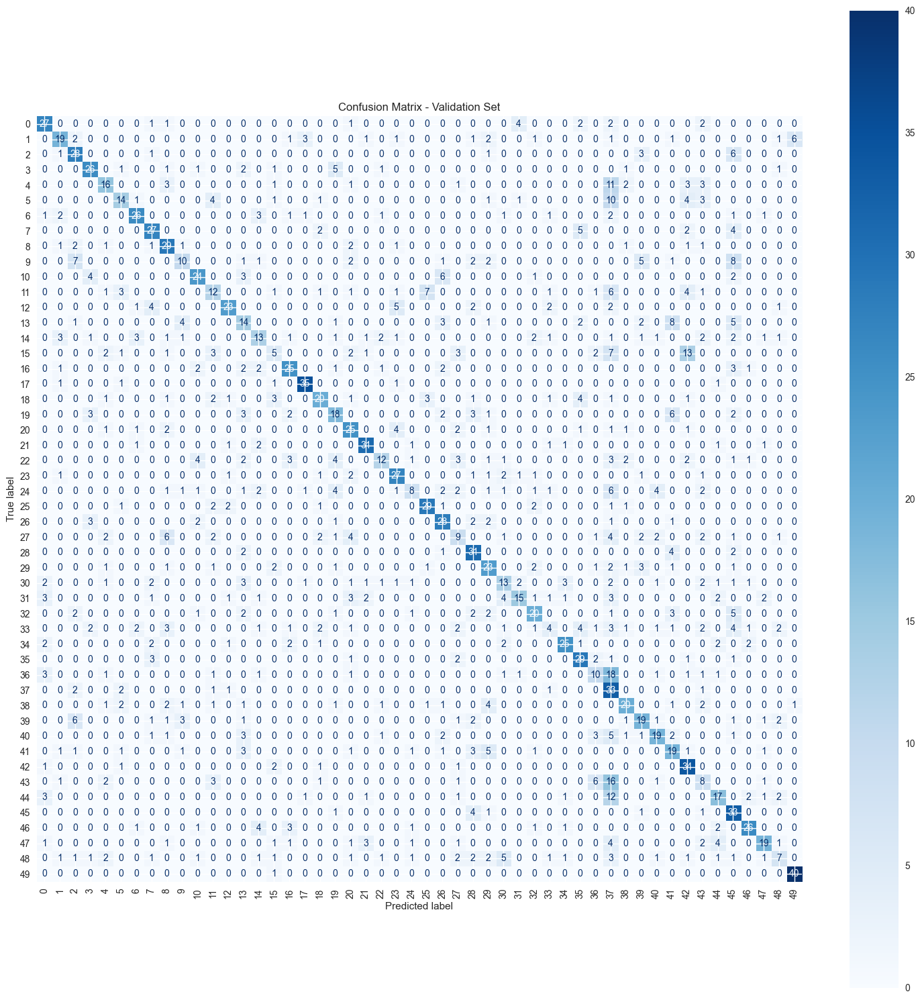

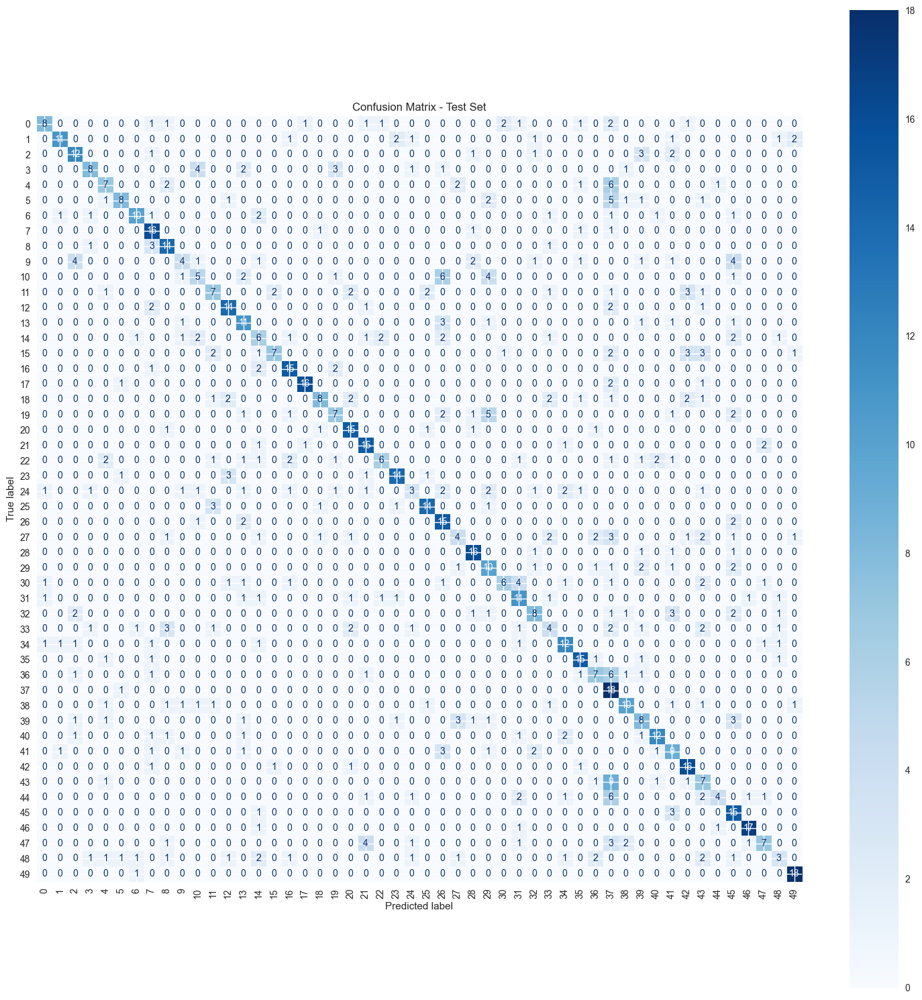

In [111]:
possible_classes = np.arange(0, 50)

pred_val = CRNN3_model.predict(X_val_norm)
pred_test = CRNN3_model.predict(X_test_norm)

pred_val_classes = np.argmax(pred_val, axis=1)
pred_test_classes = np.argmax(pred_test, axis=1)

# Confusion Matrix - Validation
cm_val = confusion_matrix(y_val, pred_val_classes)
fig_val, ax_val = plt.subplots(figsize=(15, 15))  
disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val, display_labels=possible_classes)
disp_val.plot(cmap=plt.cm.Blues, ax=ax_val, xticks_rotation=90)
ax_val.set_title('Confusion Matrix - Validation Set')
plt.tight_layout()
plt.show()

# Confusion Matrix - Test
cm_test = confusion_matrix(y_test, pred_test_classes)
fig_test, ax_test = plt.subplots(figsize=(15, 15))
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=possible_classes)
disp_test.plot(cmap=plt.cm.Blues, ax=ax_test, xticks_rotation=90)
ax_test.set_title('Confusion Matrix - Test Set')
plt.tight_layout()
plt.show()

In [112]:
print(classification_report(y_val, pred_val_classes, zero_division=0))

              precision    recall  f1-score   support

           0       0.63      0.68      0.65        40
           1       0.59      0.47      0.53        40
           2       0.54      0.70      0.61        40
           3       0.65      0.65      0.65        40
           4       0.50      0.39      0.44        41
           5       0.52      0.35      0.42        40
           6       0.72      0.63      0.68        41
           7       0.60      0.68      0.64        40
           8       0.53      0.71      0.60        41
           9       0.45      0.25      0.32        40
          10       0.65      0.60      0.62        40
          11       0.38      0.30      0.33        40
          12       0.74      0.57      0.65        40
          13       0.33      0.34      0.33        41
          14       0.42      0.33      0.37        40
          15       0.25      0.12      0.17        40
          16       0.62      0.62      0.62        40
          17       0.83    

In [113]:
print(classification_report(y_test, pred_test_classes, zero_division=0))

              precision    recall  f1-score   support

           0       0.67      0.40      0.50        20
           1       0.79      0.55      0.65        20
           2       0.55      0.60      0.57        20
           3       0.62      0.40      0.48        20
           4       0.44      0.37      0.40        19
           5       0.67      0.40      0.50        20
           6       0.71      0.53      0.61        19
           7       0.52      0.80      0.63        20
           8       0.54      0.74      0.62        19
           9       0.40      0.20      0.27        20
          10       0.33      0.25      0.29        20
          11       0.44      0.35      0.39        20
          12       0.64      0.70      0.67        20
          13       0.44      0.58      0.50        19
          14       0.29      0.30      0.29        20
          15       0.70      0.35      0.47        20
          16       0.65      0.75      0.70        20
          17       0.89    